# Homework 2: Probability Models

BEE 4850/5850

**Name**: Luan Brito

**ID**: ls2236

> **Due Date**
>
> Friday, 2/21/25, 9:00pm

## Overview

### Instructions

The goal of this homework assignment is to practice developing and
working with probability models for data.

-   Problem 1 asks you to fit a sea-level rise model using normal
    residuals and to assess the validity of that assumption.
-   Problem 2 asks you to model the time series of hourly
    weather-related variability at a tide gauge using an autoregressive
    model.
-   Problem 3 asks you to use Poisson regression to predict salamander
    counts based on environmental data.
-   Problem 4 (only required for students in BEE 5850) asks you to look
    at the impact of the gender of hurricane names on deaths[1].

[1] Yes, seriously. Ish. Trust me, I know.

### Load Environment

The following code loads the environment and makes sure all needed
packages are installed. This should be at the start of most Julia
scripts.

In [2]:
import Pkg
Pkg.activate(@__DIR__)
Pkg.instantiate()

  Activating project at `~/Projects/bee_5850/hw02-britols`


The following packages are included in the environment (to help you find
other similar packages in other languages). The code below loads these
packages for use in the subsequent notebook (the desired functionality
for each package is commented next to the package).

In [3]:
using Random # random number generation and seed-setting
using DataFrames # tabular data structure
using CSV # reads/writes .csv files
using Distributions # interface to work with probability distributions
using Plots # plotting library
using StatsBase # statistical quantities like mean, median, etc
using StatsPlots # some additional statistical plotting tools
using Optim # optimization tools

## Problems

### Scoring

-   Problem 1 is worth 7 points.
-   Problem 2 is worth 6 points.
-   Problem 3 is worth 7 points.
-   Problem 4 is worth 5 points.

### Problem 1

Consider the following sea-level rise model from [Grinsted et al
(2010)](https://doi.org/10.1007/s00382-008-0507-2), which models
sea-level rise based on a linear relationship between global mean
temperature and an “equilibrium” sea level:

$$\begin{align*}
\frac{dS}{dt} &= \frac{S_\text{eq} - S}{\tau} \\
S_\text{eq} &= aT + b,
\end{align*}
$$

where

-   $S(t)$ is the global mean sea level (in mm) at time $t$;
-   $\tau$ is the response time of sea level (in yrs);
-   $S_\text{eq}$ is the equilibrium sea-level (in mm) at temperature
    $T$ (in $^\circ C$);
-   $a$ is the sensitivity of $S_\text{eq}$ to $T$ (in mm/$^\circ C$);
-   $b$ is the intercept of $S_\text{eq}$, or the $S_\text{eq}$ when
    $T=0^\circ C$  (in mm).

**In this problem**:

-   Load the data from the `data/` folder and, following Grinsted et al
    (2010), normalize both datasets to the 1980-1999 mean (subtract that
    mean from the data).
    -   Global mean temperature data from the HadCRUT 5.0.2.0 dataset
        (<https://hadobs.metoffice.gov.uk/hadcrut5/data/HadCRUT.5.0.2.0/download.html>)
        can be found in
        `data/HadCRUT.5.0.2.0.analysis.summary_series.global.annual.csv`.
        This data is averaged over the Northern and Southern Hemispheres
        and over the whole year.
    -   Global mean sea level anomalies (relative to the 1990 mean
        global sea level) are in `data/CSIRO_Recons_gmsl_yr_2015.csv`,
        courtesy of CSIRO
        (<https://www.cmar.csiro.au/sealevel/sl_data_cmar.html>). The
        standard deviation of the estimate is also added for each year.
-   Write a function to simulate global mean sea levels under a set of
    model parameters after discretizing the equations above with a
    timestep of $\delta t = 1$ yr. You will need to subset the
    temperature data to the years where you also have sea-level data.
-   Fit the model under the assumption of Gaussian i.i.d. residuals
    (include both an uncertain model error term and the standard
    deviation of the observations in the probability model
    specification) by maximizing the likelihood. Report the parameter
    estimates. Note that you will need another parameter $S_0$ for the
    initial sea level. What can you conclude about the relationship
    between global mean temperature increases and global mean sea level
    rise rates?
-   How appropriate was the Gaussian i.i.d. probability model for the
    residuals? Use any needed quantitative or qualitative assessments of
    goodness of fit to justify your answer. If this was not an
    appropriate probability model, what would you change?

$$S(t+1) = S(t) + \frac{S_{eq} - S(t)}{\tau}\delta t$$
$$S_{eq} = aT + b$$

In [4]:
#S(t+1) = S(t) + dt (Seq - S)/tau
#Seq = aT + b
#When dS/dt =0 -> S(t) = Seq
# a < (Smax - bmin)/Tmin < 2m/C
# b  < 5m

#temp_obs = gta[!, "Anomaly (deg C)"];
#temp_sd =  gta[!,"Upper confidence limit (97.5%)"]/1.96;


In [5]:
gta =  CSV.read("data/HadCRUT.5.0.2.0.analysis.summary_series.global.annual.csv", DataFrame);
goa = CSV.read("data/CSIRO_Recons_gmsl_yr_2015.csv", DataFrame);

In [6]:
#Convert to years
goa[:, 1]=  Int64.(goa[:, 1] .+ 0.5);

In [7]:
#Time subset
gta_time = Int64.(gta[:, 1]);
goa_time = Int64.(goa[:, 1]);

years_in_common = Int64.(intersect(gta_time, goa_time));

gta_idx = indexin(years_in_common,gta_time); # find indices in t vector of simulation years
goa_idx = indexin(years_in_common,goa_time);

gta = gta[gta_idx,:];
goa = goa[goa_idx,:];

In [8]:
#Normalize data
gta_mean = mean(gta[ ( gta.Time .> 1979 ) .& ( gta.Time .< 2000 ), 2]);
goa_mean = mean(goa[ ( goa.Time .> 1979 ) .& ( goa.Time .< 2000 ), 2]);

In [9]:
gta_time = Int64.(gta[:, 1]);
gta_obs = gta[:, 2];
gta_lo = gta[:, 3];
gta_hi = gta[:, 4];

gta_lo = gta_lo .- gta_mean;
gta_hi = gta_hi .- gta_mean;
gta_obs = gta_obs .- gta_mean;# compute anomalies relative to first 20 years of data
gta_sd = (gta_hi - gta_lo) / 1.96; # estimate standard deviation using 95% CI

In [10]:
goa_time =  Int64.(goa[:, 1]);
goa_obs = goa[:, 2];
goa_lo = goa_obs - 1.96*goa[:, 3];
goa_hi = goa_obs + 1.96*goa[:, 3];

goa_lo = goa_lo .- goa_mean;
goa_hi = goa_hi .- goa_mean;
goa_obs = goa_obs .- goa_mean;# compute anomalies relative to first 20 years of data
goa_sd = (goa_hi - goa_lo) / 1.96; # estimate standard deviation using 95% CI

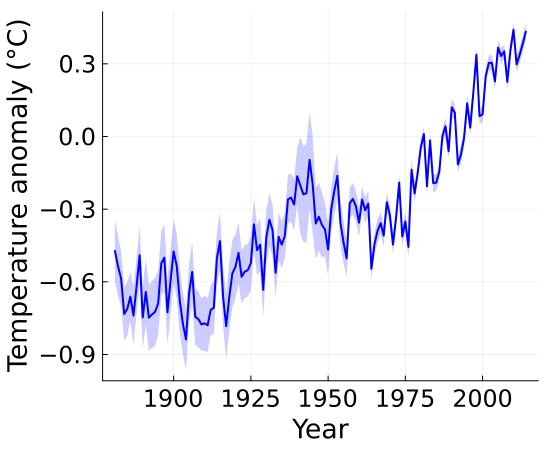

In [11]:
plot(gta_time, gta_obs, ribbon=(gta_obs-gta_lo,gta_hi-gta_obs), color="blue", linewidth=2, fillalpha=0.2, legend=false, xlabel="Year", ylabel="Temperature anomaly (°C)", labelfontsize=18, tickfontsize=16)
plot!(size=(550, 450))

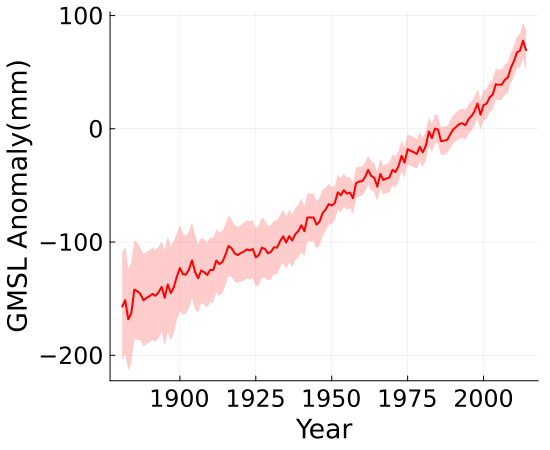

In [12]:
plot(goa_time, goa_obs, ribbon=(goa_obs-goa_lo,goa_hi-goa_obs), color="red", linewidth=2, fillalpha=0.2, legend=false, xlabel="Year", ylabel="GMSL Anomaly(mm)", labelfontsize=18, tickfontsize=16)
plot!(size=(550, 450))

In [13]:
function ebm(T; p=(10, 1000, 4000, -156.98))
    # set up model parameters
    τ, a, b, S₀ = p # this unpacks the parameter tuple into variables
    #Δt = 31558152. # annual timestep [s]
    Δt = 1
    S = zero(T)
    S[1] = S₀
    for i in 1:length(T)-1
        S[i+1] = S[i] + (a*T[i]+b - S[i])/τ * Δt
    end
    # return after normalizing to reference period
    return S
end

ebm_wrap(params) = ebm(gta_obs, p = params)

ebm_wrap (generic function with 1 method)

In [14]:
#To  [-0.357935, -0.232246, -0.106556]
#So [-204.421,-156.989,-109.558]
#Seq = -0.232246 * a + b


In [15]:
function gaussian_iid_homosked(params, temp_dat, temp_err, m)
    τ, a, b, S₀, σ = params 
    ebm_sim = m((τ, a, b, S₀))
    #ll = sum(logpdf.(Normal.(ebm_sim, sqrt.(σ^2 .+ temp_err.^2)), temp_dat))
    ll = sum(logpdf.(Normal.(ebm_sim, sqrt.(temp_err.^2)), temp_dat))
    return ll
end
#       [τ, a, b, S₀, σ]
lower = [0,0, 0.0,goa_lo[1],0]
upper = [2000,10000, 5000.0, goa_hi[1],10]
p0 = [7, 500, 500, goa_obs[1],5]


result = Optim.optimize(params -> -gaussian_iid_homosked(params, goa_obs, goa_sd, ebm_wrap), lower, upper, p0)
θ_iid = result.minimizer

5-element Vector{Float64}:
  153.6771537852954
  501.45698134603407
  353.25154601651525
 -154.9789978848337
    5.046785409077171

| Parameters    | MLE |
| -------- | ------- |
| τ  | 153.7    |
| a | 501.4    |
| b   | 353.2    |
| S₀    | -155.0   |
| $\sigma$    | 0.0    |

In [16]:
n_samples = 10_000
temp_iid = ebm_wrap(θ_iid) # simulate IID best fit
# simulate projections with discrepancy and errors
temp_iid_proj = zeros(n_samples, length(goa_sd))
for i = 1:length(goa_sd)
    #temp_iid_err = rand(Normal(0, sqrt.(θ_iid[end]^2 .+ goa_sd[i]^2)), n_samples)
    temp_iid_err = rand(Normal(0, sqrt.(θ_iid[end]^2)), n_samples)
    temp_iid_proj[:, i] = temp_iid[i] .+ temp_iid_err
end
# calculate quantiles
temp_iid_q = mapslices(col -> quantile(col, [0.05, 0.5, 0.95]), temp_iid_proj; dims=1);

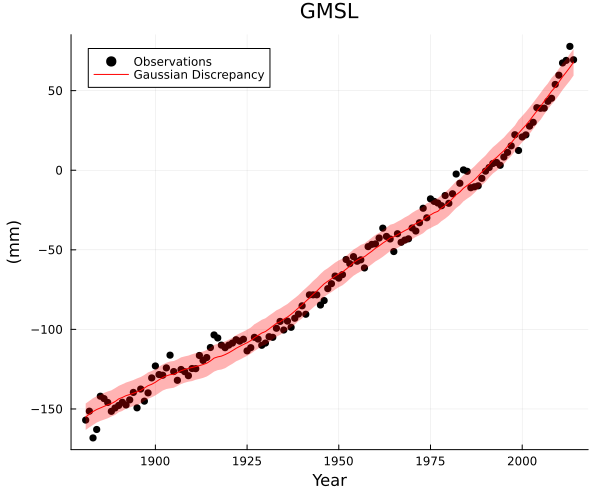

In [17]:
p = scatter(goa_time, goa_obs, color=:black, label="Observations", ylabel="(mm)", xlabel="Year", title="GMSL")
plot!(p, goa_time, temp_iid_q[2, :], ribbon=(temp_iid_q[2, :] - temp_iid_q[1, :], temp_iid_q[3, :] - temp_iid_q[2, :]), color=:red, fillalpha=0.3, label="Gaussian Discrepancy")
plot!(size=(600, 500))

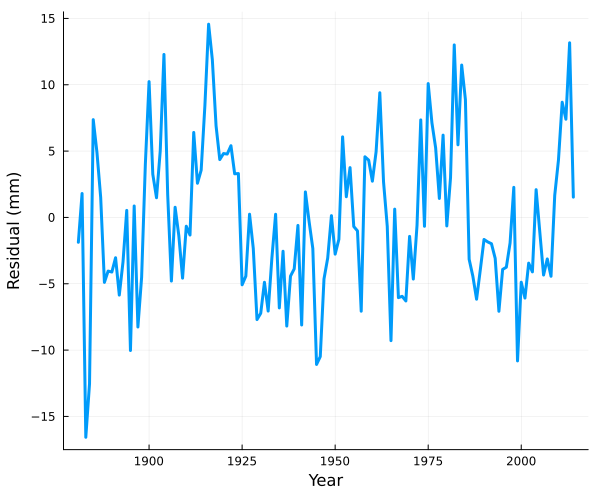

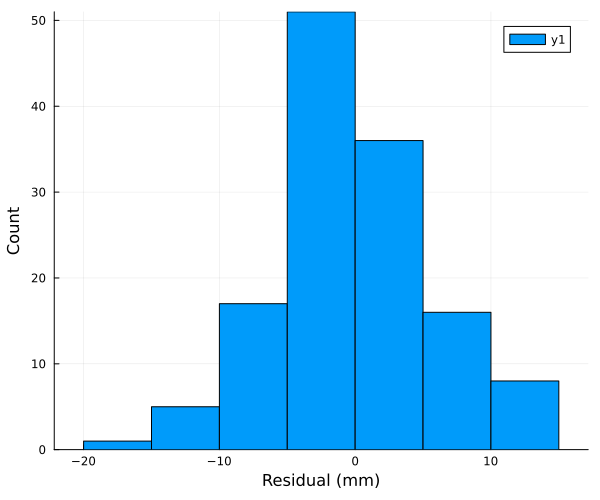

In [18]:
resids_homogauss = goa_obs - temp_iid_q[2, :]
p1 = plot(goa_time, resids_homogauss, linewidth=3, label=false, size=(600, 500), xlabel="Year", ylabel="Residual (mm)")
p2 = histogram(resids_homogauss, size=(600, 500), xlabel="Residual (mm)", ylabel="Count")

display(p1)
display(p2)

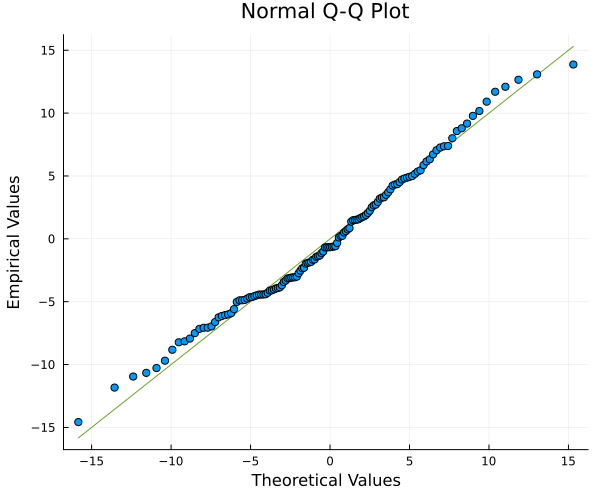

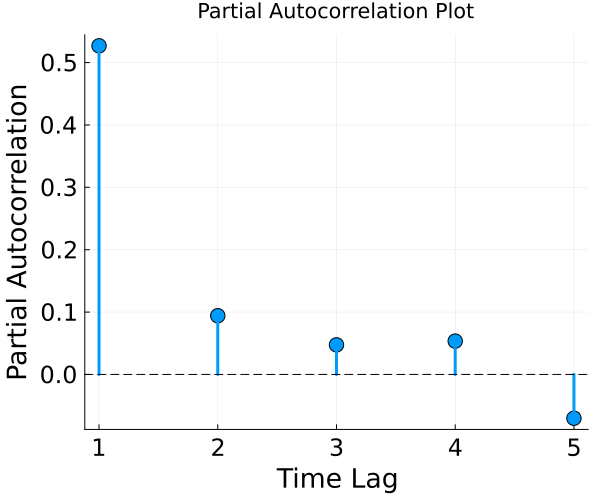

In [19]:
p1 = qqnorm(resids_homogauss, xlabel="Theoretical Values", ylabel="Empirical Values", title="Normal Q-Q Plot", size=(600, 500))
pacf_homogauss = pacf(resids_homogauss, 1:5)
p2 = plot(1:5, pacf_homogauss, marker=:circle, line=:stem, linewidth=3, markersize=8, tickfontsize=16, guidefontsize=18, legend=false, ylabel="Partial Autocorrelation", xlabel="Time Lag", title="Partial Autocorrelation Plot", size=(600, 500))
hline!(p2, [0], color=:black, linestyle=:dash)

display(p1)
display(p2)

### Problem 2

Tide gauge data is complicated to analyze because it is influenced by
different harmonic processes (such as the linear cycle). In this
problem, we will develop a model for this data using [NOAA data from the
Sewell’s Point tide
gauge](https://tidesandcurrents.noaa.gov/waterlevels.html?id=8638610)
outside of Norfolk, VA from `data/norfolk-hourly-surge-2015.csv`. This
is hourly data (in m) from 2015 and includes both the observed data
(`Verified (m)`) and the tide level predicted by NOAA’s sinusoidal model
for periodic variability, such as tides and other seasonal cycles
(`Predicted (m)`).

**In this problem**:

-   Load the data file. Take the difference between the observations and
    the sinusoidal predictions to obtain the tide level which could be
    attributed to weather-related variability (since for one year
    sea-level rise and other factors are unlikely to matter). Plot this
    data.
-   Develop an autoregressive (AR) model for the weather-related
    variability in the Norfolk tide gauge. Make sure to include your
    logic or exploratory analysis used in determining the model
    specification.
-   Use your model to simulate 1,000 realizations of hourly tide gauge
    observations by adding simulations from your AR model back to the
    predicted sinusoidal trend. What is the distribution of the maximum
    tide level? How does this compare to the observed value?

**answer:** p is really vlose to one...maybe AR not good model for extremes

In [20]:
# Load the data file
surge =  CSV.read("data/norfolk-hourly-surge-2015.csv", DataFrame);

In [21]:
surge[1:3,:]

Row,Date,Time (GMT),Predicted (m),Preliminary (m),Verified (m)
,String15,Time,Float64,String1,Float64
1,2015/01/01,00:00:00,0.48,-,0.616
2,2015/01/01,01:00:00,0.325,-,0.432
3,2015/01/01,02:00:00,0.145,-,0.242


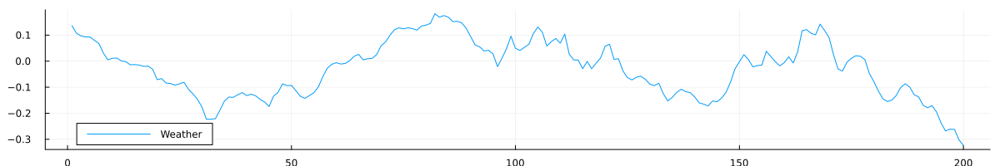

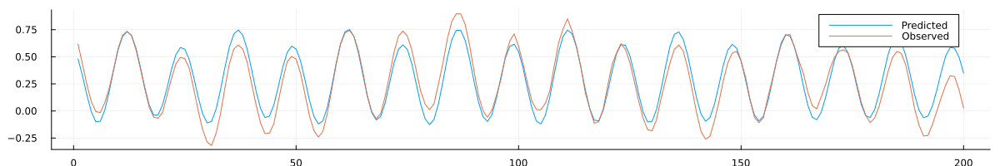

In [22]:
# Take the difference between the observations and the sinusoidal predictions to obtain the tide level which could be attributed to weather-related variability
predicted_surge = surge[:,"Predicted (m)"]
observed_surge = surge[:,"Verified (m)"]
weather_surge = observed_surge .- predicted_surge
p1 = plot(weather_surge[1:200],size=(1200, 200),label="Weather")
p2 = plot(predicted_surge[1:200],size=(1200, 200),label="Predicted")
p3 = plot!(p2,observed_surge[1:200],size=(1200, 200),label="Observed")
display(p1)
display(p2)

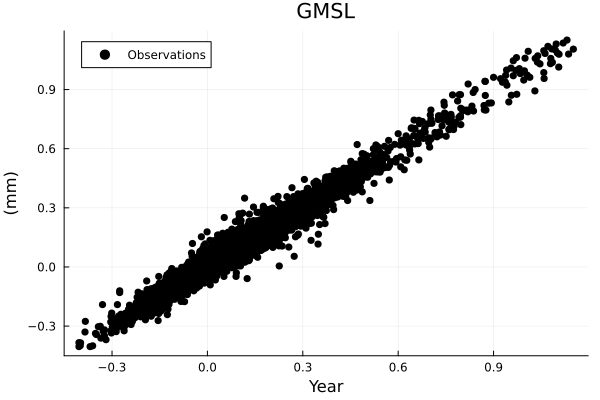

In [23]:
lag = 2
t = weather_surge[1:(size(weather_surge)[1]-lag)];
t_1=weather_surge[(1+lag):(size(weather_surge)[1])];
p = scatter(t, t_1, color=:black, label="Observations", ylabel="(mm)", xlabel="Year", title="GMSL")

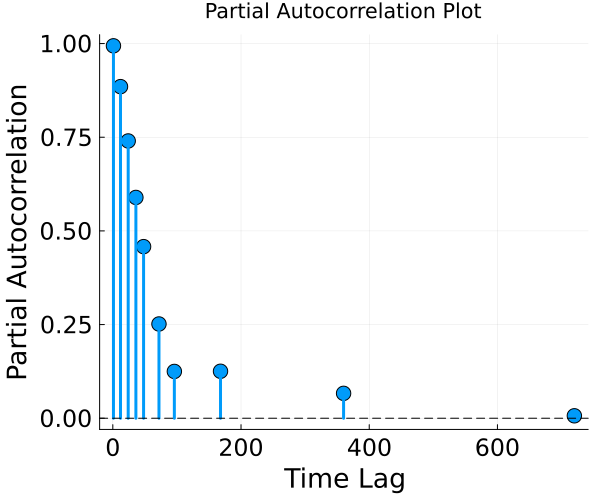

In [24]:
p=autocor(weather_surge,[1,12,24,36,48,72,96,168,360,720])
p2 = plot([1,12,24,36,48,72,96,168,360,720], p, marker=:circle, line=:stem, linewidth=3, markersize=8, tickfontsize=16, guidefontsize=18, legend=false, ylabel="Partial Autocorrelation", xlabel="Time Lag", title="Partial Autocorrelation Plot", size=(600, 500))
hline!(p2, [0], color=:black, linestyle=:dash)

In [25]:
function ar1_loglik_whitened(θ, dat)
    # might need to include mean or trend parameters as well
    # subtract trend from data to make this mean-zero in this case
    ρ, σ = θ
    T = length(dat)
    ll = 0 # initialize log-likelihood counter
    for i = 1:T
        if i == 1
            ll += logpdf(Normal(0, sqrt(σ^2 / (1 - ρ^2))), dat[i])
        else
            ll += logpdf(Normal(ρ * dat[i-1], σ), dat[i])
        end
    end
    return ll
end

ar1_loglik_whitened (generic function with 1 method)

In [26]:
lb = [-0.99, 0.01]
ub = [0.99, 5]
init = [0.6, 0.3]

result = Optim.optimize(params -> -ar1_loglik_whitened(params,weather_surge), lb, ub, init)
θ_ar = result.minimizer

2-element Vector{Float64}:
 0.9899999999999999
 0.019700177414995697

In [27]:
θ_ar[1]

0.9899999999999999

In [28]:
n = 1000
temp_sd = weather_surge
# get model hindcasts
temp_ar = predicted_surge

# get iid and AR residuals from relevant processes
residuals_ar = zeros(length(weather_surge), n)
for t = 1:length(weather_surge)
    if t == 1
        residuals_ar[t, :] = rand(Normal(0, sqrt(θ_ar[2]^2 / (1 - θ_ar[1]^2))), n)
    else
        residuals_ar[t, :] =  θ_ar[1] * residuals_ar[t-1, :] + rand(Normal(0, sqrt(θ_ar[2]^2)), n)
    end
end

# add residuals back to model simulations
model_sim_ar = (residuals_ar .+ temp_ar)'

# get quantiles
q90_ar = mapslices(col -> quantile(col, [0.05, 0.5, 0.95]), model_sim_ar; dims=1) # compute 90% prediction interval

3×8760 Matrix{Float64}:
 0.251377  0.096027  -0.0819425  …  0.112697  -0.0324509  -0.148459
 0.478414  0.320268   0.140647      0.340305   0.192943    0.0702768
 0.705564  0.544025   0.370728      0.571776   0.426557    0.311128

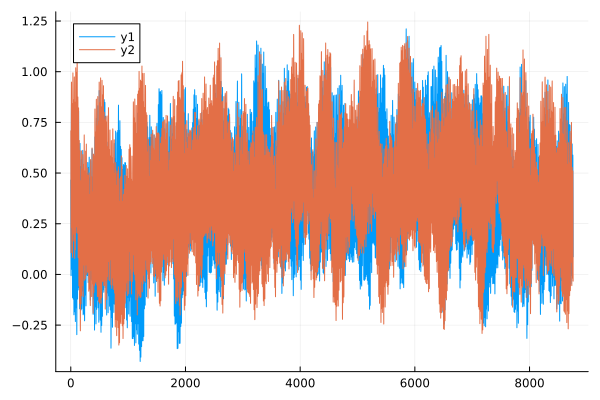

In [29]:
plot(model_sim_ar[2,:])
plot!(model_sim_ar[500,:])


In [30]:
max_tides=mapslices(col -> maximum(col), model_sim_ar; dims=2);

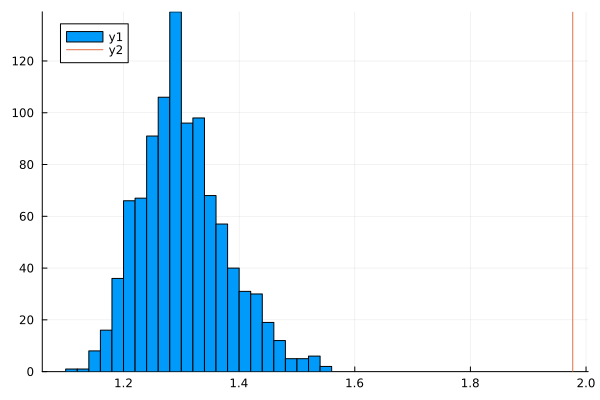

In [31]:
histogram(max_tides[:,1])
plot!([maximum(observed_surge)],seriestype="vline")

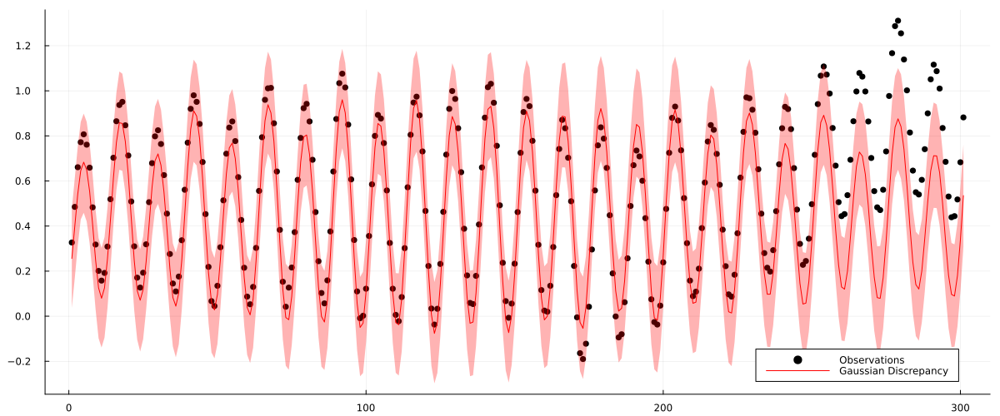

In [32]:
pos=5000:5300
p = scatter( observed_surge[pos], color=:black, label="Observations", ylabel="", xlabel="", title="")
plot!(p,  q90_ar[2, pos], ribbon=(q90_ar[2, pos] - q90_ar[1, pos], q90_ar[3, pos] - q90_ar[2, pos]), color=:red, fillalpha=0.3, label="Gaussian Discrepancy")
plot!(size=(1200, 500))

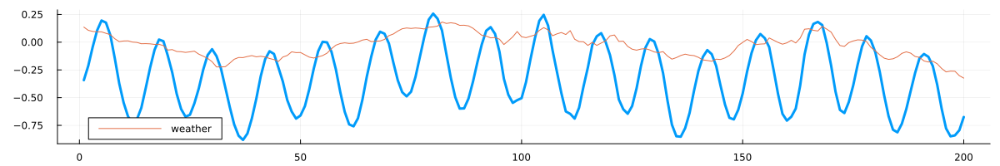

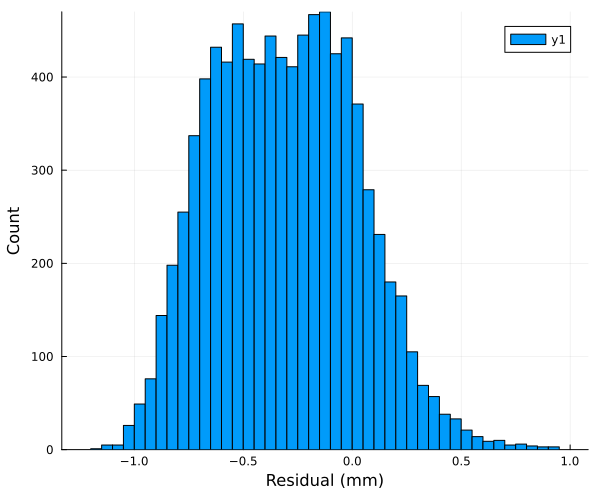

In [33]:
resids_homogauss = weather_surge .- q90_ar[2,:]
p1 = plot(resids_homogauss[1:200], linewidth=3, label=false, size=(600, 500), xlabel="Year", ylabel="Residual (mm)")
#plot!(p1,observed_surge[1:200],size=(1200, 200),label="Observed")
plot!(p1,weather_surge[1:200],size=(1200, 200),label="weather")
#plot!(p1,predicted_surge[1:200],size=(1200, 200),label="predicted")
#plot!(p1,ts_sim_q[2,1:200],size=(1200, 200),label="other")

p2 = histogram(resids_homogauss, size=(600, 500), xlabel="Residual (mm)", ylabel="Count")

display(p1)
display(p2)

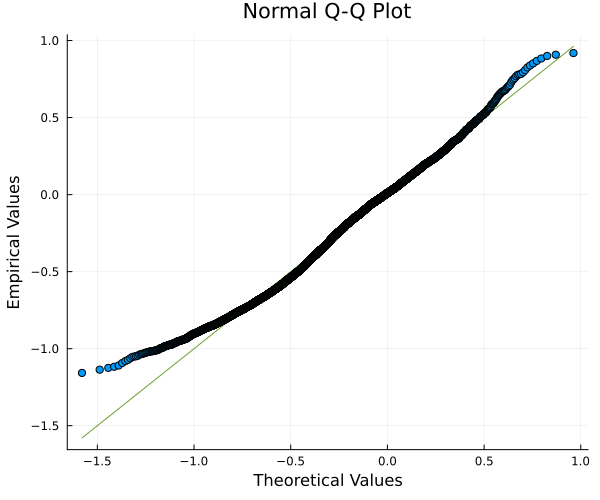

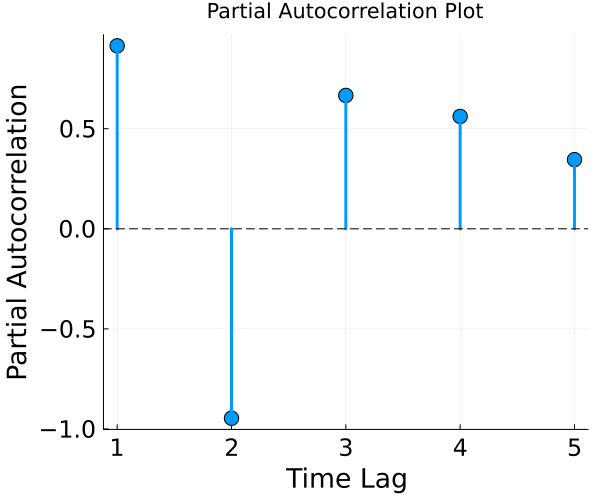

In [34]:
p1 = qqnorm(resids_homogauss, xlabel="Theoretical Values", ylabel="Empirical Values", title="Normal Q-Q Plot", size=(600, 500))
pacf_homogauss = pacf(resids_homogauss, 1:5)
p2 = plot(1:5, pacf_homogauss, marker=:circle, line=:stem, linewidth=3, markersize=8, tickfontsize=16, guidefontsize=18, legend=false, ylabel="Partial Autocorrelation", xlabel="Time Lag", title="Partial Autocorrelation Plot", size=(600, 500))
hline!(p2, [0], color=:black, linestyle=:dash)

display(p1)
display(p2)

## Problem 3

The file `data/salamanders.csv` contains counts of salamanders from 47
different plots of the same area in California, as well as the
percentage of ground cover and age of the forest in the plot. You would
like to see if you can use these data to predict the salamander counts
with a Poisson regression.

**In this problem**:

-   Load the data. You may need to standardize the predictors as they
    are much larger than the counts.
-   Fit a Poisson regression model for salamander counts using the
    percentage of ground cover.
-   Plot the expected counts and 90% prediction intervals from your
    model. How well does the model predict the observed counts? In what
    ways does it do a good or bad job?
-   Can you improve the model by including forest age? Why do you think
    this helps or does not help with prediction?

**Answer:** The negative binomial distribution, especially in its alternative parameterization described above, can be used as an alternative to the Poisson distribution. It is especially useful for discrete data over an unbounded positive range whose sample variance exceeds the sample mean. In such cases, the observations are overdispersed with respect to a Poisson distribution, for which the mean is equal to the variance. Hence a Poisson distribution is not an appropriate model. Since the negative binomial distribution has one more parameter than the Poisson, the second parameter can be used to adjust the variance independently of the mean. See Cumulants of some discrete probability distributions.

In [35]:
# Load the data file
salamanders =  CSV.read("data/salamanders.csv", DataFrame);

In [36]:
#Standardize predictors
salamanders[!,"PCTCOVER_STDA"] = (salamanders.PCTCOVER .- mean(salamanders.PCTCOVER))/std(salamanders.PCTCOVER);
salamanders[!,"FORESTAGE_STDA"] = (salamanders.FORESTAGE .- mean(salamanders.FORESTAGE))/std(salamanders.FORESTAGE);

In [37]:
mean(salamanders.SALAMAN)

2.4680851063829787

In [38]:
var(salamanders.SALAMAN)

11.384828862164662

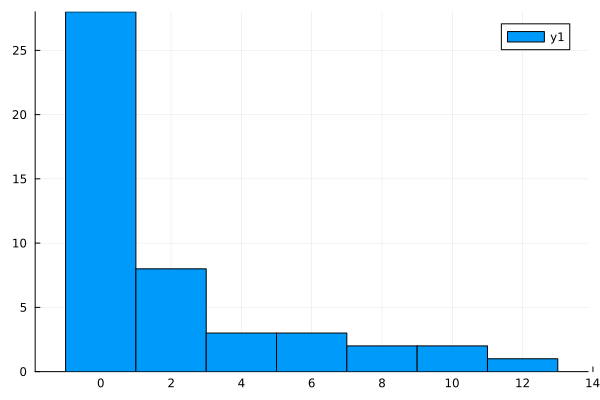

In [39]:
histogram(salamanders.SALAMAN,bins=[0:2:14;],xticks=([0:2:14;].+1,[0:2:14;]))

In [40]:
function salamander_model(params, pctcover, salamanders)
    β₀, β₁ = params
    λ = exp.(β₀ .+ β₁ * pctcover)
    loglik = sum(logpdf.(Poisson.(λ), salamanders))
end

lb = [-100.0, -100.0]
ub = [100.0, 100.0]
init = [5.0, 5.0]

optim_out = optimize(θ -> -salamander_model(θ, salamanders.PCTCOVER_STDA, salamanders.SALAMAN), lb, ub, init)
θ_mle = optim_out.minimizer
@show round.(θ_mle; digits=2)

round.(θ_mle; digits = 2) = [0.43, 1.16]


2-element Vector{Float64}:
 0.43
 1.16

In [41]:
# simulate 10,000 predictions
x = -2:0.1:1
λ = exp.(θ_mle[1] .+ θ_mle[2] * x)

y_pred = zeros(length(x), 10_000)
for i = 1:length(x)
    #λ = exp.(θ_mle[1] .+ θ_mle[2] * salamanders.PCTCOVER_STDA[i])
    y_pred[i, :] = rand(Poisson(λ[i]), 10_000)
end
# take quantiles to find prediction intervals
y_q = mapslices(v -> quantile(v, [0.1, 0.5, 0.90]), y_pred; dims=2);

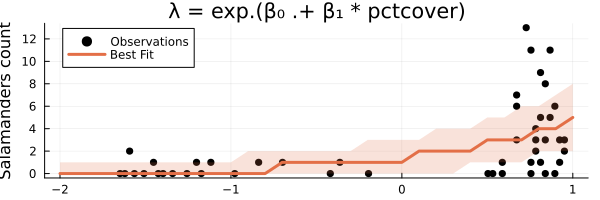

In [42]:
p1 = scatter(salamanders.PCTCOVER_STDA, salamanders.SALAMAN, color=:black, label="Observations", ylabel="Salamanders count", xlabel="", title="λ = exp.(β₀ .+ β₁ * pctcover)")
plot(p1, 
    x,
    y_q[:, 2],
    ribbon = (y_q[:, 2] - y_q[:, 1], y_q[:, 3] - y_q[:, 2]),
    linewidth=3, 
    fillalpha=0.2, 
    label="Best Fit",
    size=(600, 200))


In [43]:
#FORESTAGE
function salamander_model(params, pctcover, forestage,salamanders)
    β₀, β₁,β₂ = params
    λ = exp.(β₀ .+ β₁ * pctcover + β₂*forestage)
    loglik = sum(logpdf.(Poisson.(λ), salamanders))
end

lb = [-100.0, -100.0,-100.0]
ub = [100.0, 100.0,100.0]
init = [0.0, 0.0,0.0]

optim_out = optimize(θ -> -salamander_model(θ, salamanders.PCTCOVER_STDA, salamanders.FORESTAGE_STDA,salamanders.SALAMAN), lb, ub, init)
θ_mle_w_forest = optim_out.minimizer
@show round.(θ_mle_w_forest; digits=3)

round.(θ_mle_w_forest; digits = 3) = [0.429, 1.162, -0.004]


3-element Vector{Float64}:
  0.429
  1.162
 -0.004

In [44]:
# simulate 10,000 predictions
x = 1:47
λ = exp.(θ_mle[1] .+ θ_mle[2] * salamanders.PCTCOVER_STDA)
λ_w_forest = exp.(θ_mle_w_forest[1] .+ θ_mle_w_forest[2] * salamanders.PCTCOVER_STDA + θ_mle_w_forest[3] * salamanders.FORESTAGE_STDA)
y_pred = zeros(length(x), 10_000)
y_predw_forest = zeros(length(x), 10_000)
for i = 1:length(x)
    y_pred[i, :] = rand(Poisson(λ[i]), 10_000)
    y_predw_forest[i, :] = rand(Poisson(λ_w_forest[i]), 10_000)
end
# take quantiles to find prediction intervals
y_q = mapslices(v -> quantile(v, [0.1, 0.5, 0.9]), y_pred; dims=2);
y_q_w_forest = mapslices(v -> quantile(v, [0.1, 0.5, 0.9]), y_predw_forest; dims=2);

In [45]:
resid = salamanders.SALAMAN - y_q[:, 2];
resid_w_forest = salamanders.SALAMAN - y_q_w_forest[:,2];

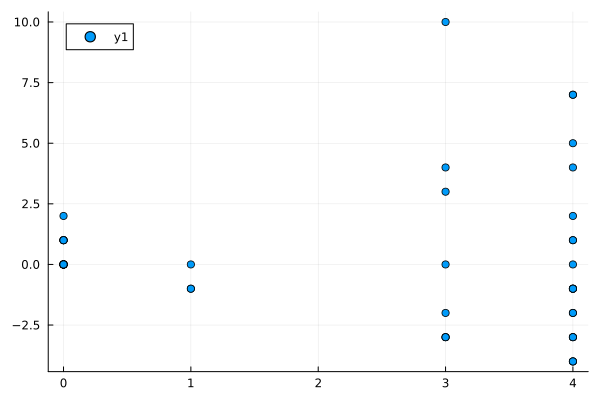

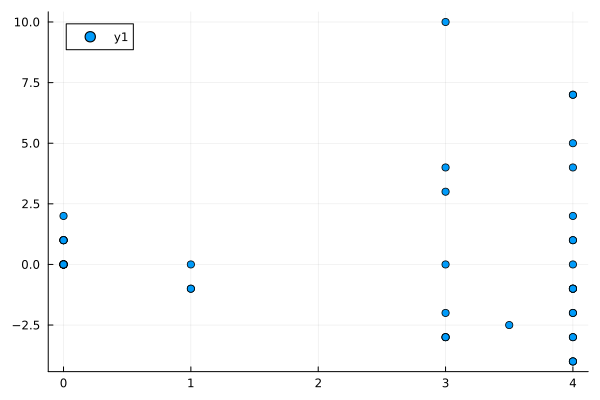

In [46]:
p1 = scatter(y_q[:, 2],resid)
p2 = scatter(y_q_w_forest[:, 2],resid_w_forest)

display(p1)
display(p2)

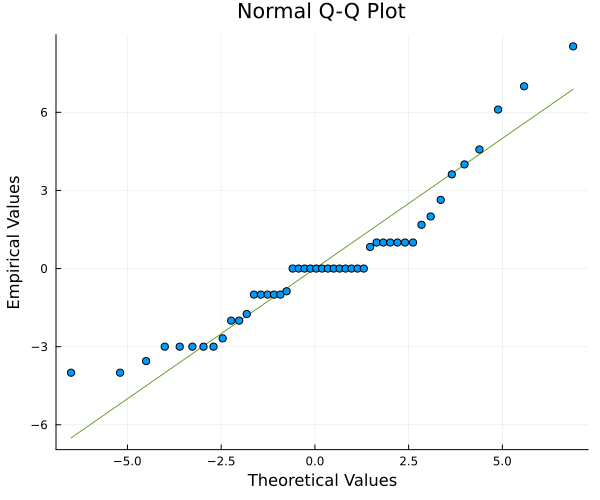

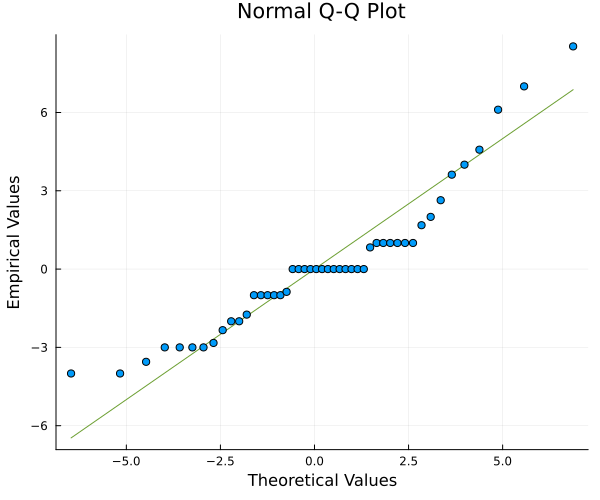

In [47]:
p1 = qqnorm(resid, xlabel="Theoretical Values", ylabel="Empirical Values", title="Normal Q-Q Plot", size=(600, 500))
p2 = qqnorm(resid_w_forest, xlabel="Theoretical Values", ylabel="Empirical Values", title="Normal Q-Q Plot", size=(600, 500))

display(p1)
display(p2)

In [48]:
salamanders[1,:]

Row,SITE,SALAMAN,PCTCOVER,FORESTAGE,PCTCOVER_STDA,FORESTAGE_STDA
,Int64,Int64,Int64,Int64,Float64,Float64
1,1,13,85,316,0.727323,0.760627


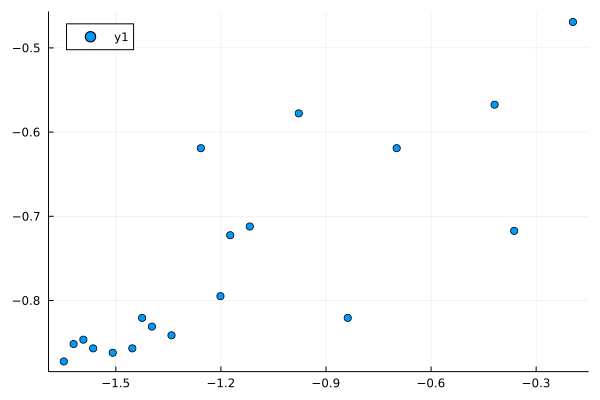

In [49]:
scatter(salamanders[salamanders.PCTCOVER_STDA .< 0.5,"PCTCOVER_STDA"],salamanders[salamanders.PCTCOVER_STDA .< 0.5,"FORESTAGE_STDA"])



In [50]:
cor(salamanders[:,"PCTCOVER_STDA"],salamanders[:,"FORESTAGE_STDA"])

0.625460015282306

In [51]:
cor(salamanders[salamanders.PCTCOVER_STDA .< 0.5,"PCTCOVER_STDA"],salamanders[salamanders.PCTCOVER_STDA .< 0.5,"FORESTAGE_STDA"])

0.805575270968347

### Problem 4

<span style="color:red;">GRADED FOR 5850 STUDENTS ONLY</span>

In 2014, [a paper was published in a prestigious
journal](https://www.pnas.org/doi/10.1073/pnas.1402786111) which claimed
that hurricanes with more feminine names are deadlier than hurricanes
with more masculine names because people take warnings about
female-named hurricanes less seriously[1]. The file
`data/Hurricanes.csv` contains the original data used in this analysis.
While we won’t replicate the specific analysis in this paper, let’s use
the data to look at this hypothesis.

**In this problem**:

-   One might interpret the hypothesis to claim that the impact of the
    name is strengthened by the the more powerful. A measure of
    hurricane strength is its minimum pressure (`min_pressure` in the
    dataset). Fit a model that predicts deaths (‘deaths’) using the
    femininity of the name (`femininity`) and minimum pressure (you may
    need to standardize the pressure).
-   Interpret the results by generating counterfactual simulations for
    hurricanes with the most feminine and masculine name scores. Plot
    the expected values and 90% prediction intervals from these two sets
    of simulations and compare with the observed storm deaths. Where
    does the model do well or not well? Does the effect size of the
    gender of the name seem plausible?
-   Conclude with a summary of your conclusions about the impact of the
    gender of a hurricane’s name on deaths. How might you change the
    approach in this problem to keep exploring this hypothesis, if at
    all?

[1] This paper has become a bit of a joke among statisticians, but let’s
take the hypothesis seriously for this problem’s sake.

**Answer:** Variance is higher than mean, but not because excess zeroes (10 hurricanes with 0 deaths)

fix some value of large femininity, and plot in the deaths x min_pressure plot. Do the same with low femininity.

inter-mingling in a region

In [72]:
hurricanes =  CSV.read("data/Hurricanes.csv", DataFrame);
hurricanes[1:3,:]

Row,name,year,deaths,category,min_pressure,damage_norm,female,femininity
,String15,Int64,Int64,Int64,Int64,Int64,Int64,Float64
1,Easy,1950,2,3,960,1590,1,6.77778
2,King,1950,4,3,955,5350,0,1.38889
3,Able,1952,3,1,985,150,0,3.83333


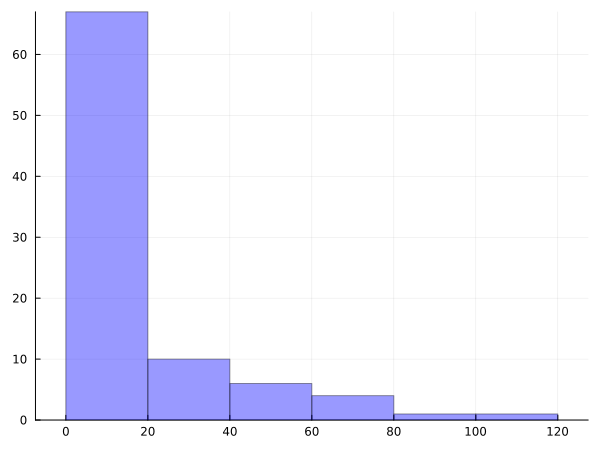

In [53]:
p1 = histogram(hurricanes[:,3], color=:blue, xlabel="", ylabel="", label="", size=(600, 450), alpha=0.4, title="",bins=[0,20,40,60,80,100,120])
display(p1)

In [73]:
var(hurricanes.deaths)

1673.1524128045867

In [ ]:
hurricanes[!,"deaths_scaled"] = hurricanes.deaths #(hurricanes.deaths .- mean(hurricanes.deaths))/std(hurricanes.deaths);
hurricanes[!,"min_pressure_scaled"] = (hurricanes.min_pressure .- mean(hurricanes.min_pressure))/std(hurricanes.min_pressure);
hurricanes[!,"femininity_scaled"] = hurricanes.femininity #(hurricanes.femininity .- mean(hurricanes.femininity))/std(hurricanes.femininity);

In [ ]:
names = hurricanes[hurricanes.female .==1,"name"]
scatter(hurricanes[hurricanes.female .==1,"min_pressure"],hurricanes[hurricanes.female .==1,"deaths"],color=["blue"], series_annotations = text.(names, :top),markersize=5,label="female")
scatter!(hurricanes[hurricanes.female .!=1,"min_pressure"],hurricanes[hurricanes.female .!=1,"deaths"],color=["red"],markersize=5,alpha=0.2,label="male")
#scatter!(x, y, series_annotations = text.(names, :top),markersize=0)


In [ ]:
names = hurricanes[hurricanes.female .!=1,"name"]
scatter(hurricanes[hurricanes.female .==1,"min_pressure"],hurricanes[hurricanes.female .==1,"deaths"],color=["blue"],markersize=5,alpha=0.2,label="female")
scatter!(hurricanes[hurricanes.female .!=1,"min_pressure"],hurricanes[hurricanes.female .!=1,"deaths"],color=["red"],series_annotations = text.(names, :top),markersize=5,label="male")
#scatter!(x, y, series_annotations = text.(names, :top),markersize=0)


In [82]:
function hurricane_model_poisson(params, min_pressure, femininity,deaths)
    β₀, β₁,β₂ = params
    λ = exp.(β₀ .+ β₁ * min_pressure + β₂ * femininity)
    loglik = sum(logpdf.(Poisson.(λ), deaths))
end

lb = [-10, -10,  -10]
ub = [10,   10,   10]
init = [0, 0,0.1]

optim_out = optimize(θ -> -hurricane_model_poisson(θ, hurricanes.min_pressure_scaled,hurricanes.femininity_scaled, hurricanes.deaths_scaled), lb, ub, init)
θ_mle_poisson = optim_out.minimizer
@show round.(θ_mle_poisson; digits=3)

round.(θ_mle_poisson; digits = 3) = [2.301, -0.715, 0.064]


3-element Vector{Float64}:
  2.301
 -0.715
  0.064

In [96]:
# simulate 10,000 predictions
x = -3:0.1:3
λ_masc = exp.(θ_mle_poisson[1] .+ θ_mle_poisson[2] * x .+ θ_mle_poisson[3]*minimum(hurricanes.femininity_scaled))
λ_fem = exp.(θ_mle_poisson[1] .+ θ_mle_poisson[2] * x .+ θ_mle_poisson[3]*maximum(hurricanes.femininity_scaled))

y_pred_poisson_masc = zeros(length(x), 10_000)
y_pred_poisson_fem = zeros(length(x), 10_000)
for i = 1:length(x)
    y_pred_poisson_masc[i, :] = rand(Poisson.(λ_masc[i]), 10_000)
    y_pred_poisson_fem[i, :] = rand(Poisson.(λ_fem[i]), 10_000)

end
# take quantiles to find prediction intervals
y_q_poisson_masc = mapslices(v -> quantile(v, [0.05, 0.5, 0.95]), y_pred_poisson_masc; dims=2);
y_q_poisson_fem = mapslices(v -> quantile(v, [0.05, 0.5, 0.95]), y_pred_poisson_fem; dims=2);

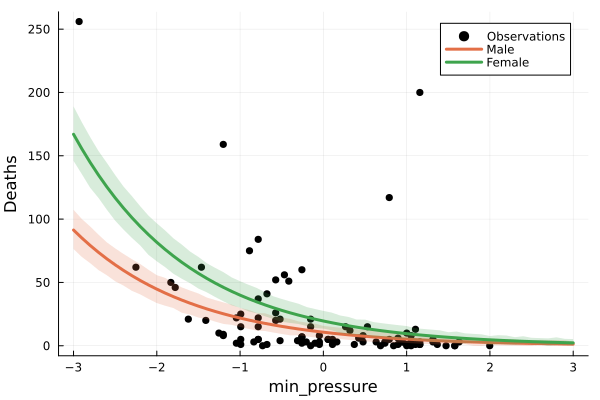

In [102]:
p1 = scatter(min_pressure, deaths, color=:black, label="Observations", ylabel="Deaths", xlabel="min_pressure", title="")

p2=plot(p1, 
    x,
    λ_masc,#y_q_poisson_masc[:, 2],
    ribbon = (y_q_poisson_masc[:, 2] - y_q_poisson_masc[:, 1], y_q_poisson_masc[:, 3] -y_q_poisson_masc[:, 2]),
    linewidth=3, 
    fillalpha=0.2, 
    label="Male")
plot(p2, 
    x,
    λ_fem,
    ribbon = (y_q_poisson_fem[:, 2] - y_q_poisson_fem[:, 1], y_q_poisson_fem[:, 3] -y_q_poisson_fem[:, 2]),
    linewidth=3, 
    fillalpha=0.2, 
    label="Female",
    size=(600, 400))

## References